## Installation

Install the library from pip or use github install to install the latest version

    pip install tfds_defect_detection

In [ ]:
!pip uninstall tfds_defect_detection
!pip install git+https://github.com/thetoby9944/tfds_defect_detection.git@master -U


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/thetoby9944/tfds_defect_detection.git (to revision master) to /tmp/pip-req-build-juiuh_t8
  Running command git clone -q https://github.com/thetoby9944/tfds_defect_detection.git /tmp/pip-req-build-juiuh_t8
  Created wheel for tfds-defect-detection: filename=tfds_defect_detection-0.1.0-py3-none-any.whl size=95736 sha256=095f99440d06b49cf38e20181de3511d65ba8842f19118c122cdfc765cb82163
  Stored in directory: /tmp/pip-ephem-wheel-cache-gw78vdis/wheels/45/b7/d0/cd347013966d50d4c44c6062ef00ee6a491afa6c42351dd019
Successfully built tfds-defect-detection


In [ ]:
import tfds_defect_detection as tfd
import albumentations as A
from pathlib import Path

## Examples

### Start by loading the MVTEC dataset

5264982680/5264982680 [==============================] - 277s 0us/step
Preparing mvtec train_images


100%|██████████| 3629/3629 [00:34<00:00, 104.46it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:21<00:00, 80.66it/s]


Dataset shape: <PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>
Uses 2903 of 3629 images from train_images
Here is the first batch


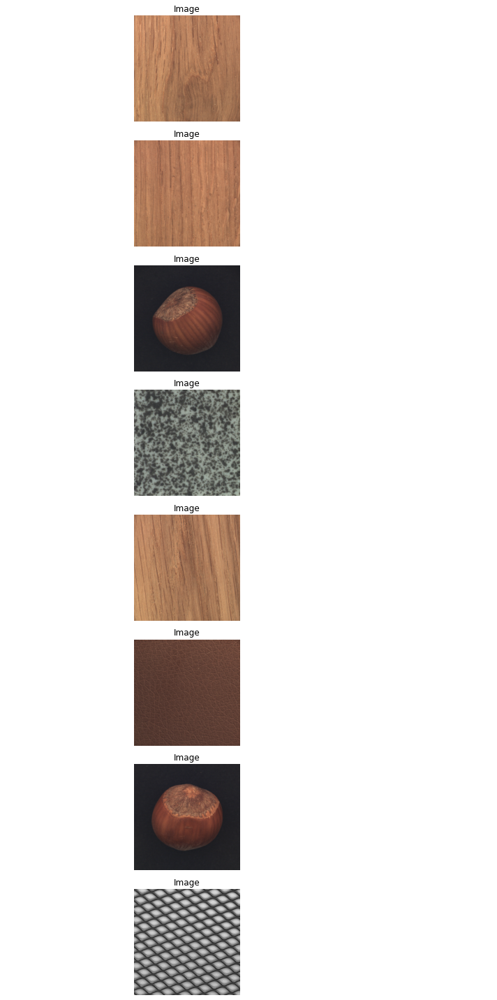

In [ ]:
ds = tfd.load(names=["mvtec"], data_dir=Path("."))

#### Disable download and preparation

After the first call, the files are cached and you can set download to False

Dataset shape: <PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>
Uses 2903 of 3629 images from train_images
Here is the first batch


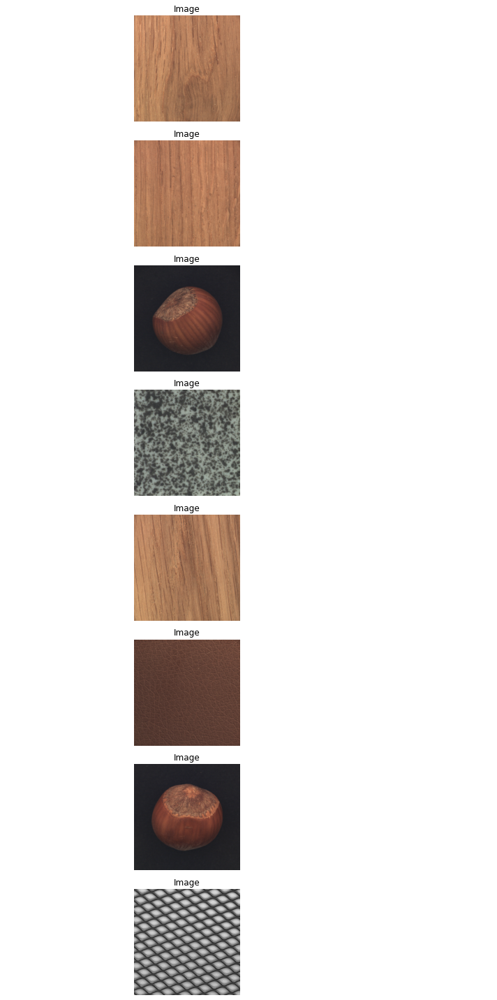

In [ ]:
ds = tfd.load(names=["mvtec"], data_dir=Path("."), download=False)

### Disable the preview

In [ ]:
ds = tfd.load(names=["mvtec"], data_dir=Path("."), peek=False, download=False)


### Enable synthetic anomalies

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 53773.51it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 48185.03it/s]


Dataset shape: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>
Uses 2903 of 3629 images from train_images
Here is the first batch


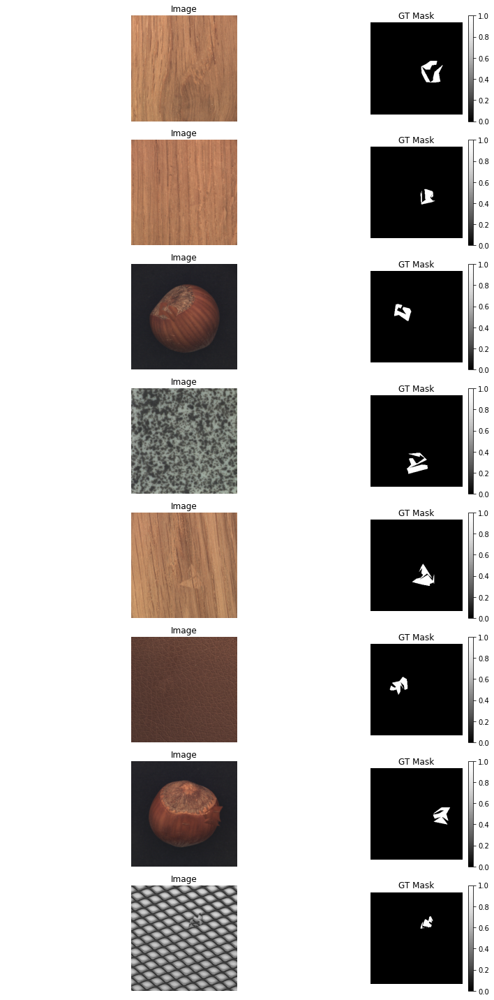

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    create_artificial_anomalies=True, 
    drop_masks=False
)


### Include original + synthetic defect

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 48606.36it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 50441.48it/s]


Dataset shape: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>
Uses 2903 of 3629 images from train_images
Here is the first batch


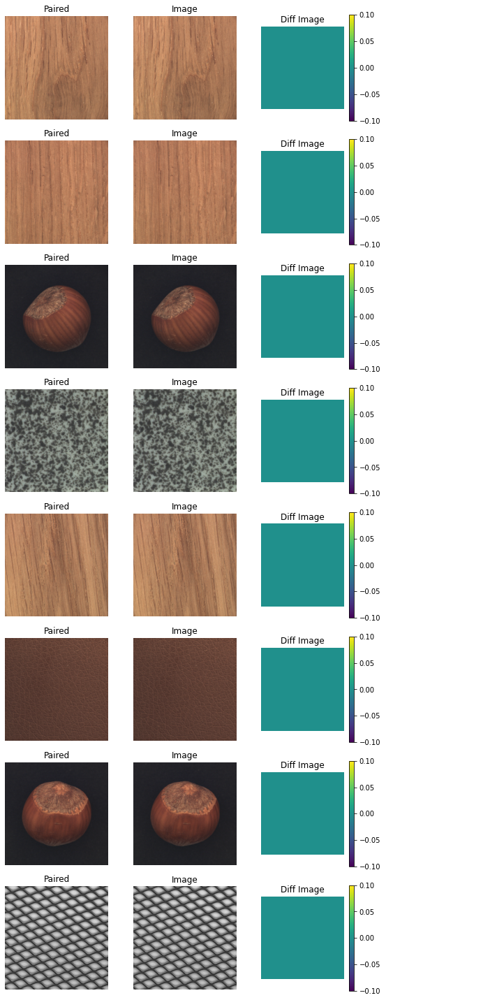

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    pairing_mode="result_with_original", 
)


## Add some artificial defects

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 38214.18it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 24277.64it/s]


Dataset shape: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>
Uses 2903 of 3629 images from train_images
Here is the first batch


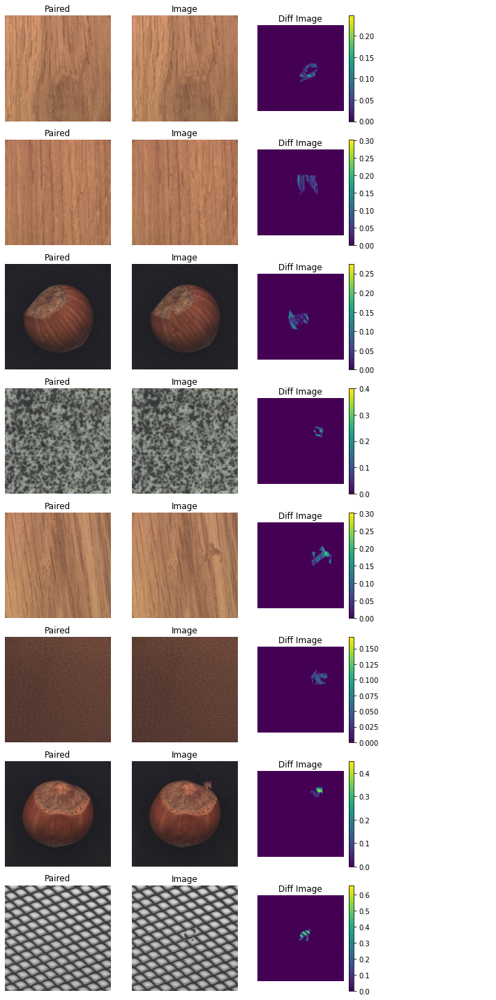

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    create_artificial_anomalies=True, 
    pairing_mode="result_with_original", 
)

## Include the defects masks for training

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 65059.79it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 68067.57it/s]


Dataset shape: <PrefetchDataset element_spec=((TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>
Uses 2903 of 3629 images from train_images
Here is the first batch


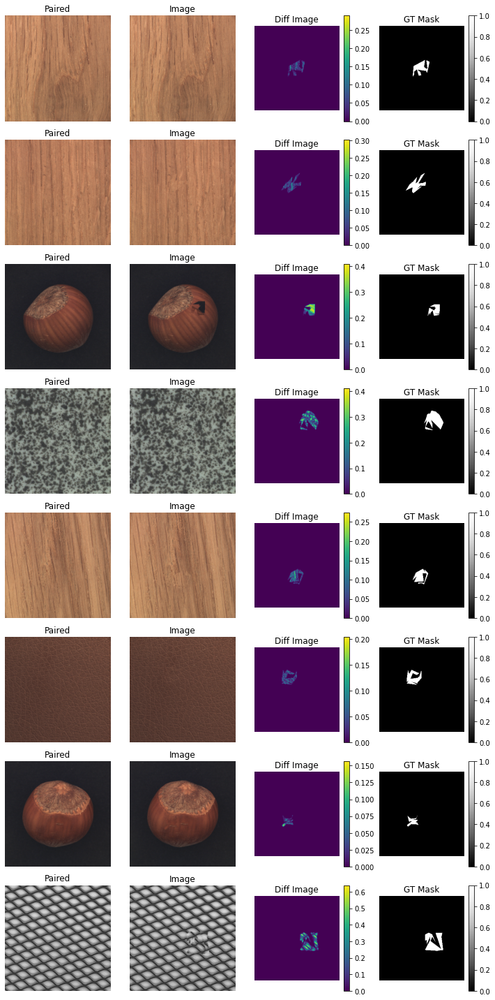

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    create_artificial_anomalies=True, 
    drop_masks=False,
    pairing_mode="result_with_original", 
)

## Include processed image and random image from same class - Contrastive Pairs

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 65337.39it/s]

Preparing

 mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 52271.23it/s]


Dataset shape: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>
Uses 2903 of 3629 images from train_images
Here is the first batch


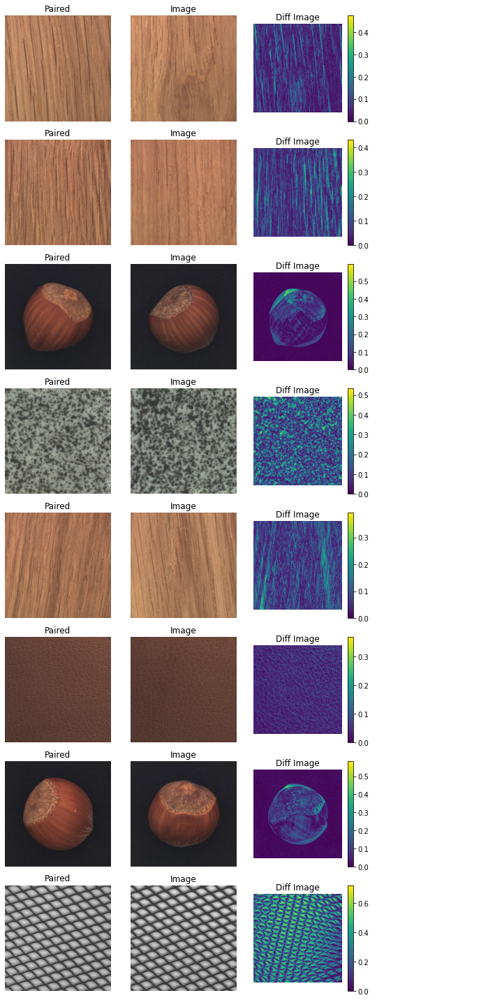

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."),
    pairing_mode="result_with_contrastive_pair", 
)

## Contrastive Pairs with artificial defects

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 22099.68it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 53009.60it/s]


Dataset shape: <PrefetchDataset element_spec=((TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>
Uses 2903 of 3629 images from train_images
Here is the first batch


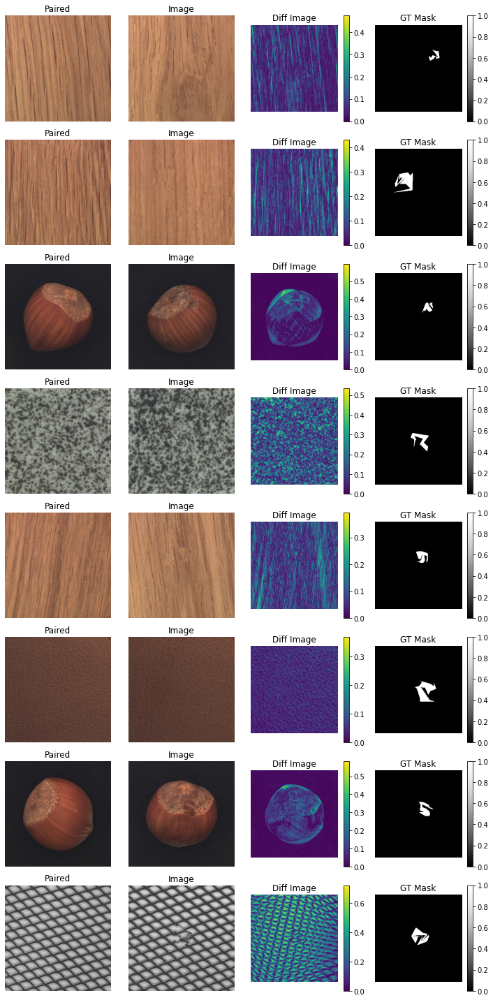

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    create_artificial_anomalies=True, 
    drop_masks=False,
    pairing_mode="result_with_contrastive_pair", 
)

## Data augmentation

Global augmentation is applied on the paired image, whereas process_transform is applied on the result image that.

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 36963.60it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 38515.09it/s]


Dataset shape: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>
Uses 2903 of 3629 images from train_images
Here is the first batch


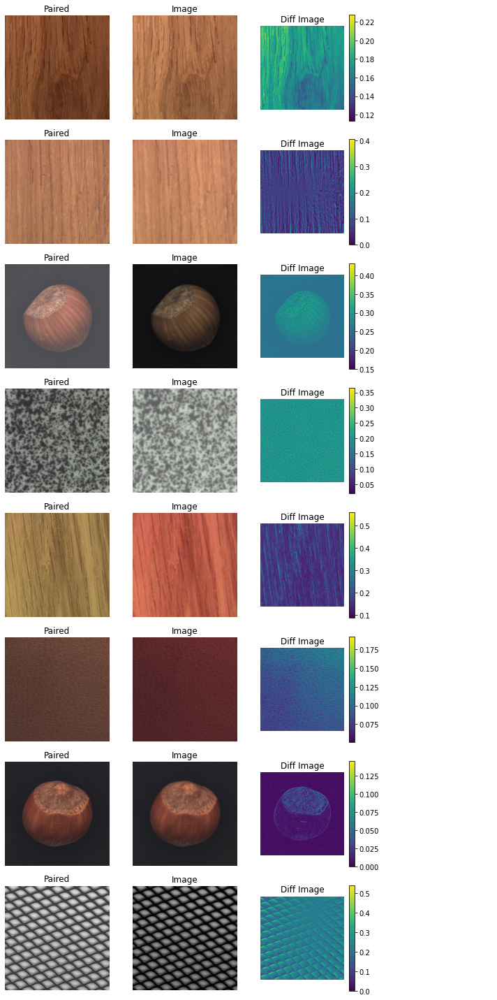

In [ ]:
# import albumentations as A

ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    pairing_mode="result_with_original", 

    global_transform=A.Compose([
      A.RandomBrightnessContrast(),
      A.HueSaturationValue(),
    ]),

    process_deviation=A.Compose([
      A.ShiftScaleRotate(shift_limit=0.01, scale_limit=0.0, rotate_limit=1.5),
      A.Blur(blur_limit=3),
      A.RandomBrightnessContrast(),
      A.RandomGamma(),
      A.HueSaturationValue(),
    ]),
)

## Artifical Defect Transforms

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:1641: FutureWarning: RandomContrast has been deprecated. Please use RandomBrightnessContrast
  FutureWarning,


Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 62988.33it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 60249.44it/s]


Dataset shape: <PrefetchDataset element_spec=((TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>
Uses 2903 of 3629 images from train_images
Here is the first batch


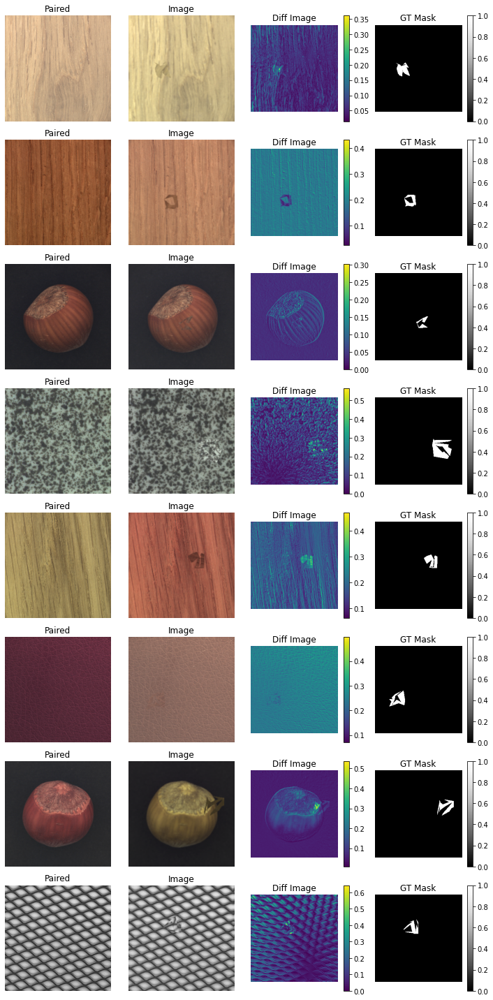

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    pairing_mode="result_with_original", 

    global_transform=A.Compose([
      A.RandomBrightnessContrast(),
      A.HueSaturationValue(),
    ]),

    process_deviation=A.Compose([
      A.ShiftScaleRotate(shift_limit=0.01, scale_limit=0.0, rotate_limit=1.5, p=1),
      A.Blur(blur_limit=3),
      A.RandomBrightnessContrast(),
      A.RandomGamma(),
      A.HueSaturationValue(),
    ]),

    anomaly_composition=A.Compose([
      A.RandomRotate90(),
      A.Transpose(),
      A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.50, rotate_limit=45, p=1),
      A.RandomGamma(),
      A.OpticalDistortion(),
      A.GridDistortion(),
      A.RandomContrast(0.5, p=1),
    ]),

    create_artificial_anomalies=True,
    drop_masks=False,
)

## Choose different image sizes

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 29049.34it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 55962.98it/s]


Dataset shape: <PrefetchDataset element_spec=TensorSpec(shape=(None, 312, 312, 3), dtype=tf.float32, name=None)>
Uses 2903 of 3629 images from train_images
Here is the first batch


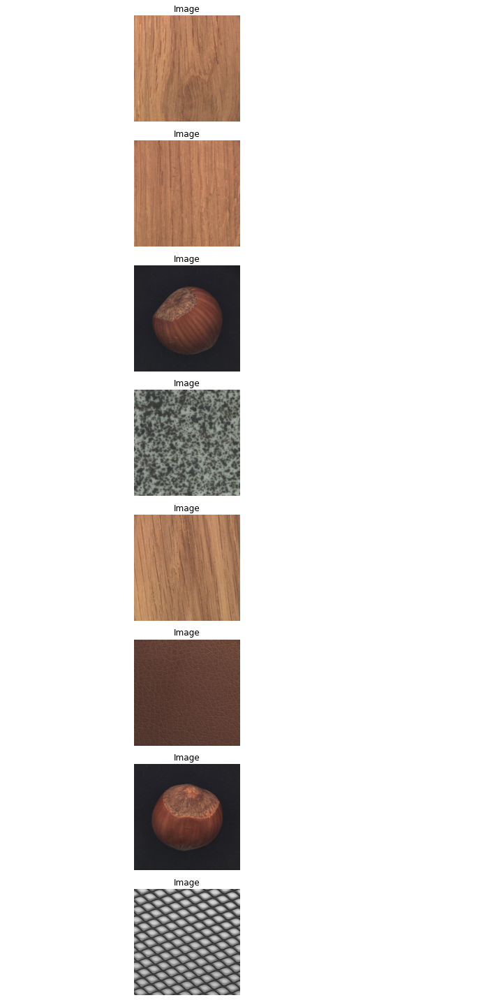

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    
    width=312, 
    height=312
)


## Choose splits

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 58913.51it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 43118.36it/s]


Dataset shape: <PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>
Uses 725 of 3629 images from train_images
Here is the first batch


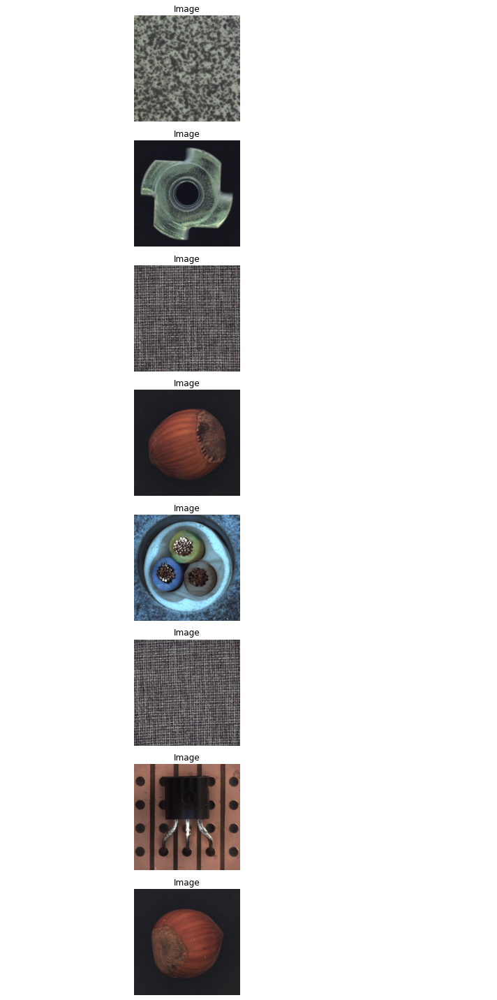

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    
    subset_mode="validation"
)


## Access hand labelled true evaluation data

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 64317.26it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 54241.16it/s]


Dataset shape: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>
Uses 1380 of 1725 images from test_images
Here is the first batch


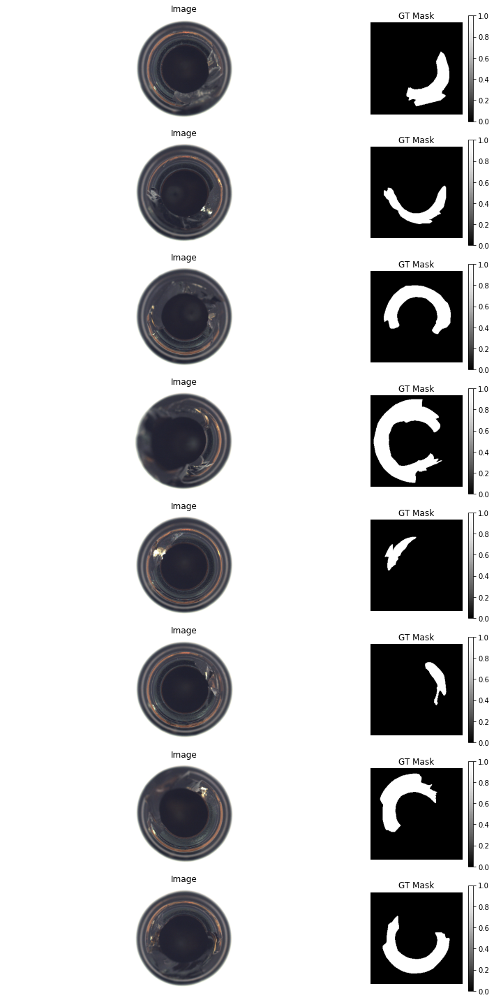

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    
    subset_mode="test",
    drop_masks=False,
    shuffle=False
)


## Change the train/validation and test/holdout split


Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 61653.46it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 59905.73it/s]


Dataset shape: <PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>
Uses 362 of 3629 images from train_images
Here is the first batch


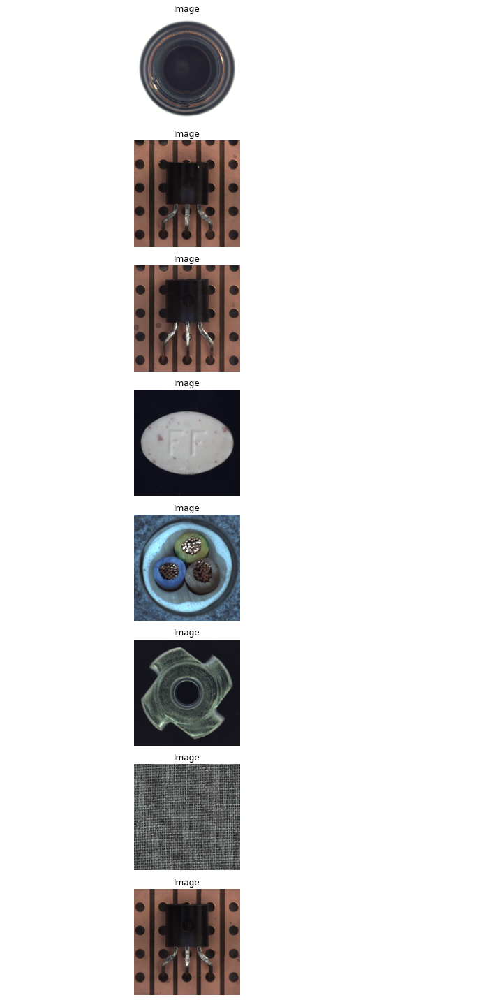

In [ ]:
ds = tfd.load(
    names=["mvtec"], 
    data_dir=Path("."), 
    
    validation_split=0.1,
    subset_mode="validation"
)


## Include more data, i.e. the visual anomalies - *VisA* dataset

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 60814.46it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 58831.17it/s]

1929840640/1929840640 [==============================] - 46s 0us/step
Converting VisA to mvtec-style dataset


100%|██████████| 10821/10821 [00:32<00:00, 331.23it/s]


Preparing VisA_mvtec_style train_images


100%|██████████| 8659/8659 [00:14<00:00, 592.52it/s] 


Preparing VisA_mvtec_style test_images and test_masks


100%|██████████| 2162/2162 [00:14<00:00, 153.57it/s]


Dataset shape: <PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>
Uses 9830 of 12288 images from train_images
Here is the first batch


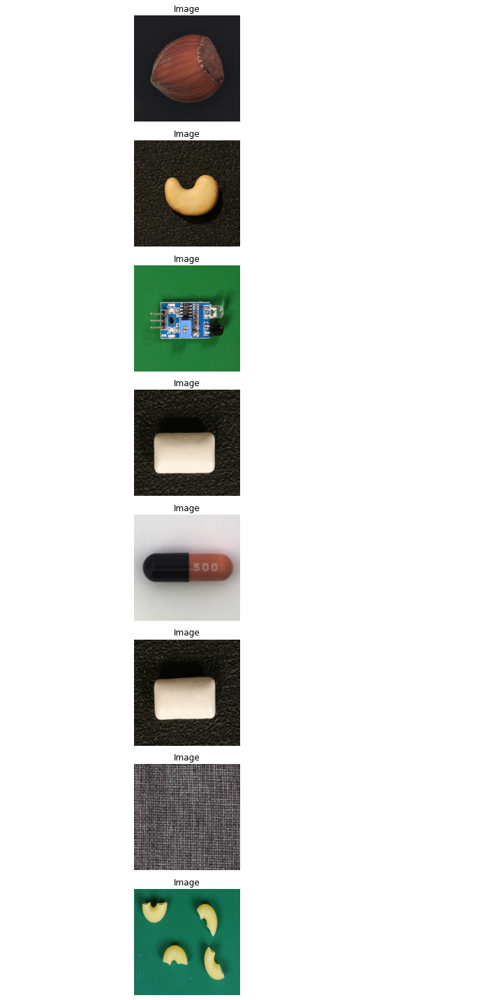

In [ ]:
ds = tfd.load(
    names=["mvtec", "visa"], 
    data_dir=Path("."), 
)


## More handlabelled data - including the VisA dataset

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 59513.33it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 41625.48it/s]


Converting VisA to mvtec-style dataset
Preparing VisA_mvtec_style train_images


100%|██████████| 8659/8659 [00:00<00:00, 51218.94it/s]


Preparing VisA_mvtec_style test_images and test_masks


100%|██████████| 2162/2162 [00:00<00:00, 59060.47it/s]


Dataset shape: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>
Uses 3109 of 3887 images from test_images
Here is the first batch


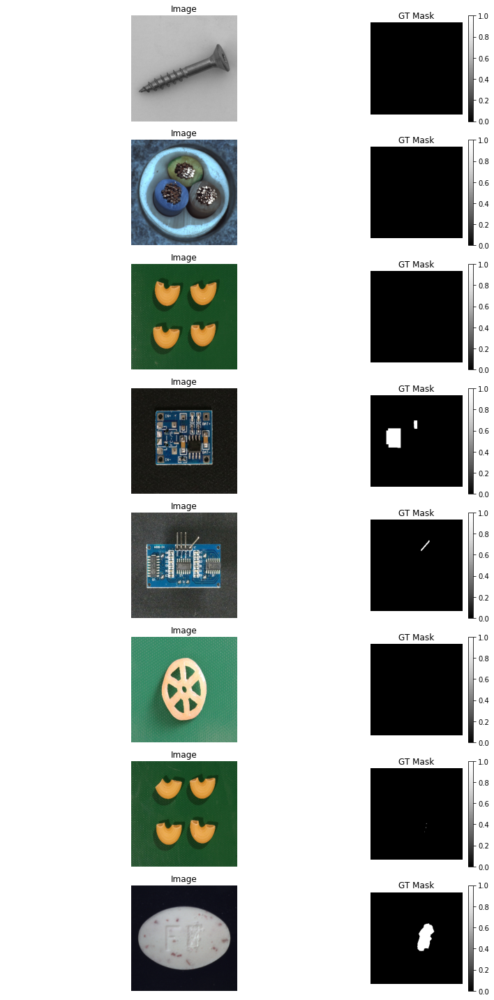

In [ ]:
ds = tfd.load(
    names=["mvtec", "visa"], 
    data_dir=Path("."), 
    
    subset_mode="test",
    drop_masks=False,
)


## Full example of all parameters

Preparing mvtec train_images


100%|██████████| 3629/3629 [00:00<00:00, 61858.42it/s]


Preparing mvtec test_images and test_masks


100%|██████████| 1725/1725 [00:00<00:00, 55825.24it/s]


Converting VisA to mvtec-style dataset
Preparing VisA_mvtec_style train_images


100%|██████████| 8659/8659 [00:00<00:00, 56129.15it/s]


Preparing VisA_mvtec_style test_images and test_masks


100%|██████████| 2162/2162 [00:00<00:00, 61246.02it/s]


Dataset shape: <PrefetchDataset element_spec=((TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>
Uses 9830 of 12288 images from train_images
Here is the first batch


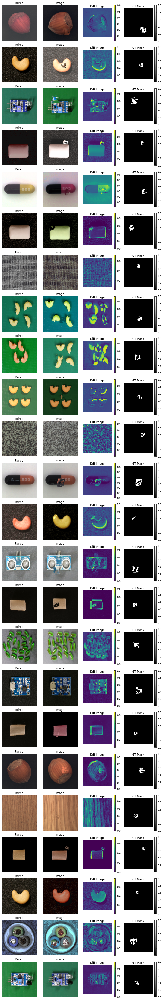

In [ ]:
ds = tfd.load(
    names = ("mvtec", "visa"),
    data_dir=Path("."),
    pairing_mode = "result_with_contrastive_pair",  # "result_only", "result_with_original"
    create_artificial_anomalies=True,
    validation_split=0.2,
    subset_mode = "training",                       # "validation", "test", "holdout", None
    drop_masks=False,
    width=256,
    height=256,
    repeat=True,
    anomaly_size = None,

    global_transform=A.Compose([
      A.RandomBrightnessContrast(),
      A.HueSaturationValue(),
    ]),

    process_deviation=A.Compose([
      A.ShiftScaleRotate(shift_limit=0.01, scale_limit=0.0, rotate_limit=1.5, p=1),
      A.Blur(blur_limit=3),
      A.RandomBrightnessContrast(),
      A.RandomGamma(),
      A.HueSaturationValue(),
    ]),

    anomaly_composition=A.Compose([
      A.RandomRotate90(),
      A.Transpose(),
      A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.50, rotate_limit=45, p=1),
      A.RandomGamma(),
      A.OpticalDistortion(),
      A.GridDistortion(),
      A.RandomContrast(0.5, p=1),
    ]),

    batch_size=24,
    seed=123,
    shuffle=True,
    peek=True,
    download=True,
    image_validation=False,
)